In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import pandas as pd
import sklearn
sklearn.set_config(print_changed_only=True)
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['savefig.bbox'] = 'tight'


In [2]:
from sklearn.linear_model import Ridge, LinearRegression, Lasso, RidgeCV, LassoCV

In [3]:
from sklearn.model_selection import cross_val_score

In [4]:
# import data
ames = pd.read_csv("data/ames_housing.csv")
ames = ames.loc[ames['Gr Liv Area'] <= 4000]

In [5]:
ames.head()


,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,1,526301100,20.0,RL,141.0,31770.0,Pave,NaN,IR1,Lvl,...,0.0,NaN,NaN,NaN,0.0,5.0,2010.0,WD,Normal,215000.0
1,2,526350040,20.0,RH,80.0,11622.0,Pave,NaN,Reg,Lvl,...,0.0,NaN,MnPrv,NaN,0.0,6.0,2010.0,WD,Normal,105000.0
2,3,526351010,20.0,RL,81.0,14267.0,Pave,NaN,IR1,Lvl,...,0.0,NaN,NaN,Gar2,12500.0,6.0,2010.0,WD,Normal,172000.0
3,4,526353030,20.0,RL,93.0,11160.0,Pave,NaN,Reg,Lvl,...,0.0,NaN,NaN,NaN,0.0,4.0,2010.0,WD,Normal,244000.0
4,5,527105010,60.0,RL,74.0,13830.0,Pave,NaN,IR1,Lvl,...,0.0,NaN,MnPrv,NaN,0.0,3.0,2010.0,WD,Normal,189900.0


In [6]:
print(ames.columns)

Index(['Order', 'PID', 'MS SubClass', 'MS Zoning', 'Lot Frontage', 'Lot Area',
       'Street', 'Alley', 'Lot Shape', 'Land Contour', 'Utilities',
       'Lot Config', 'Land Slope', 'Neighborhood', 'Condition 1',
       'Condition 2', 'Bldg Type', 'House Style', 'Overall Qual',
       'Overall Cond', 'Year Built', 'Year Remod/Add', 'Roof Style',
       'Roof Matl', 'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type',
       'Mas Vnr Area', 'Exter Qual', 'Exter Cond', 'Foundation', 'Bsmt Qual',
       'Bsmt Cond', 'Bsmt Exposure', 'BsmtFin Type 1', 'BsmtFin SF 1',
       'BsmtFin Type 2', 'BsmtFin SF 2', 'Bsmt Unf SF', 'Total Bsmt SF',
       'Heating', 'Heating QC', 'Central Air', 'Electrical', '1st Flr SF',
       '2nd Flr SF', 'Low Qual Fin SF', 'Gr Liv Area', 'Bsmt Full Bath',
       'Bsmt Half Bath', 'Full Bath', 'Half Bath', 'Bedroom AbvGr',
       'Kitchen AbvGr', 'Kitchen Qual', 'TotRms AbvGrd', 'Functional',
       'Fireplaces', 'Fireplace Qu', 'Garage Type', 'Garage Yr Blt',
      

In [7]:
from sklearn.model_selection import train_test_split
from sklearn.datasets import fetch_openml
#X_tra 
X_train, X_test, y_train, y_test = train_test_split(ames.drop(['SalePrice', 'Order', 'PID'], axis=1), ames.SalePrice, random_state=2)

In [8]:
X_train.shape


(2193, 79)

In [9]:
categorical = X_train.dtypes == object

In [10]:
X_train_cont = X_train.loc[:, ~categorical]

In [11]:
X_train_cont.shape

(2193, 36)

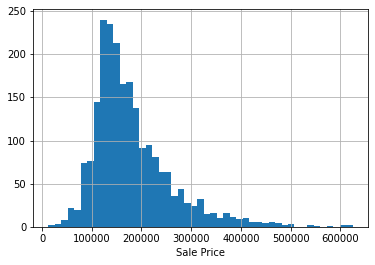

In [12]:
y_train.hist(bins='auto')
plt.xlabel('Sale Price')
plt.savefig("images/ames_housing_price_hist.png")

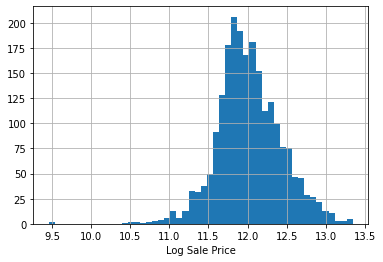

In [13]:
np.log(y_train).hist(bins='auto')
plt.xlabel('Log Sale Price')
plt.savefig("images/ames_housing_price_hist_log.png")

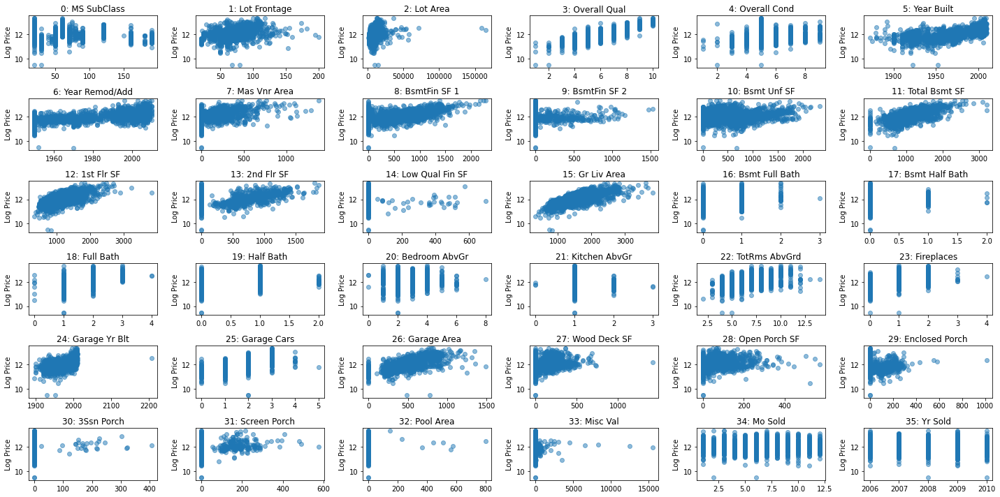

In [14]:
fig, axes = plt.subplots(6, 6, figsize=(20, 10))
for i, ax in enumerate(axes.ravel()):

    ax.plot(X_train_cont.iloc[:, i], np.log(y_train), 'o', alpha=.5)
    ax.set_title("{}: {}".format(i, X_train_cont.columns[i]))
    ax.set_ylabel("Log Price")
plt.tight_layout()
plt.savefig("images/ames_housing_scatter.png")

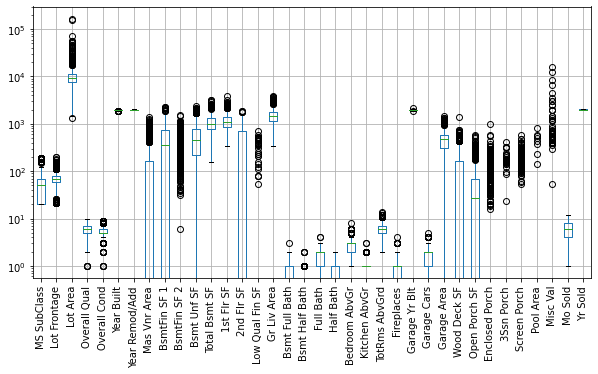

In [15]:
plt.figure(figsize=(10, 5))
X_train_cont.boxplot(rot=90)
plt.yscale('log')
plt.savefig("images/ames_scaling.png")


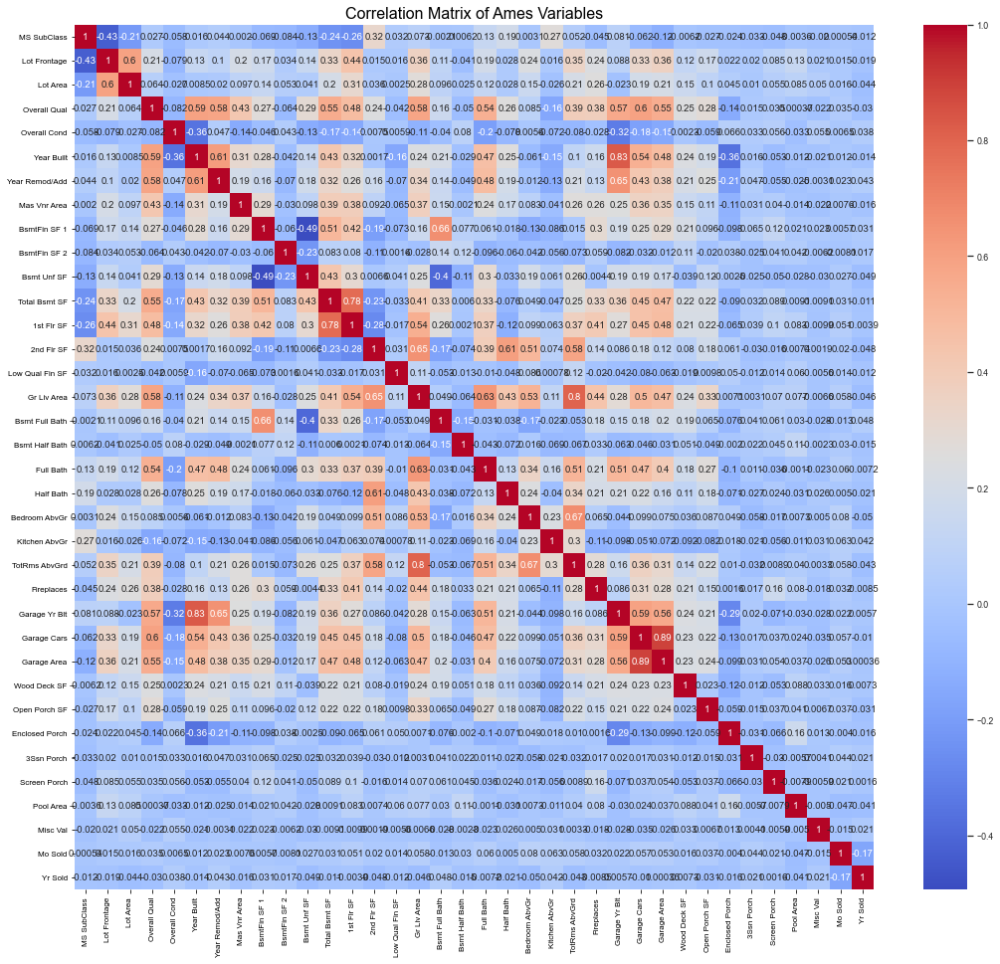

In [18]:
import seaborn as sns
fig, ax = plt.subplots(figsize=(18, 16))

sns.set(font_scale=0.8)
sns.heatmap(X_train_cont.corr(), annot=True, cmap='coolwarm', ax=ax)
ax.set_title("Correlation Matrix of Ames Variables", fontsize=16)
ax.set_xticklabels(ax.get_xmajorticklabels(), fontsize=8)
ax.set_yticklabels(ax.get_ymajorticklabels(), fontsize=8)
plt.show()

In [40]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import make_column_transformer, make_column_selector
from sklearn.pipeline import make_pipeline
cat_preprocessing = make_pipeline(SimpleImputer(strategy='constant', fill_value='NA'),
                                  OneHotEncoder(handle_unknown='ignore'))
cont_preprocessing = make_pipeline(SimpleImputer(), StandardScaler())
preprocess = make_column_transformer((cat_preprocessing, make_column_selector(dtype_include='object')),
                                      remainder=cont_preprocessing)

In [42]:
## TODO look into this function 
preprocess
ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer', SimpleImputer()),
                                            ('standardscaler',
                                             StandardScaler())]),
                  transformers=[('pipeline',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer(fill_value='NA',
                                                                strategy='constant')),
                                                 ('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore'))]),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x7f6a9a1e9fd0>)]

SyntaxError: expression cannot contain assignment, perhaps you meant "=="? (<ipython-input-42-f7559369460d>, line 5)

In [44]:
cross_val_score(make_pipeline(preprocess, LinearRegression()), X_train, y_train, cv=5)

array([0.92814935, 0.9274734 , 0.93216648, 0.89816014, 0.8837334 ])

In [45]:
from sklearn.model_selection import cross_val_predict
y_pred = cross_val_predict(make_pipeline(preprocess, LinearRegression()), X_train, y_train, cv=5)


In [46]:
from sklearn.compose import TransformedTargetRegressor
log_regressor = TransformedTargetRegressor(LinearRegression(), func=np.log, inverse_func=np.exp)
cross_val_score(make_pipeline(preprocess, log_regressor), X_train, y_train, cv=5)

array([0.9501602 , 0.9429565 , 0.9406155 , 0.91261568, 0.92242415])

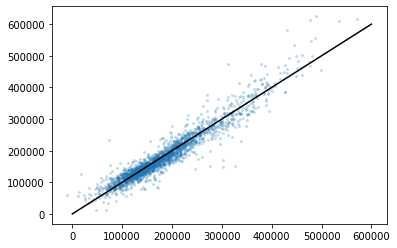

In [47]:
plt.plot([0, 600000], [0, 600000], color='k')
plt.scatter(y_pred, y_train, alpha=.2, s=4)
